**Explanation**

## User-Agnostic Multipartite Ranking

This notebook implements a userAgnostic ranking system using user clusters and filtering to improve item ranking fairness and robustness.

### **How it Works**

1.  **Cluster Rankings:**
    * Initial item rankings are computed within each user cluster, requiring minimum rating counts.
    * Clusters smaller than a given threshold are assigned to the Complementary cluster.
2.  **Intra-Cluster Reputation:**
    * Within each cluster ratings that deviate from the item average are filtered out.
3.  **Convergence & Visualization:**
    * The system iterates until rankings converge (no more ratings are filtered out).
4.  **Weighted Average:**
    * A weighted average ranking for each item is computed, using the cluster sizes as weight.
5.  **Top 3 Clusters**
    * A visualization of the distribution of rankings on the top 3 clusters is provided.

### **This notebook will:**

* Cluster users,
* Compute cluster-specific rankings with thresholds,
* Generate weighted average rankings using reputation,
* Visualize distribution of rankings.

**Imports**

In [19]:
import pandas as pd
import numpy as np
import networkx as nx
import zlib
import pickle
import os
import matplotlib.pyplot as plt
from itertools import combinations
import sys
import math
from collections import Counter
from scipy.stats import zscore
from scipy.stats import kendalltau



compressed_sizes = {}


**Load dataset**

In [11]:
# Define dataset path
file_path = "/home/martimsbaltazar/Desktop/tese/datasets/ml-1m/normalized_ratings.dat"

# Load dataset
df = pd.read_csv(file_path, sep="::", engine="python", names=["UserID", "MovieID", "Rating", "Timestamp", "NormalizedRating"])

# Display first few rows
df.head()

,UserID,MovieID,Rating,Timestamp,NormalizedRating
0,1,1193,5,978300760,1.0
1,1,661,3,978302109,0.6
2,1,914,3,978301968,0.6
3,1,3408,4,978300275,0.8
4,1,2355,5,978824291,1.0


**Dictionary with pre-computed values**

In [3]:
def compute_compressed_sizes(user_ratings):
    
    for user, ratings in user_ratings.items():
        u_string = "".join(f"{k}:{v} " for k, v in sorted(ratings.items()))
        compressed_sizes[user] = len(zlib.compress(u_string.encode()))
    
    return compressed_sizes


**Similarities**

In [12]:
def linear_similarity(ratings_u, ratings_v):
    common_items = set(ratings_u.keys()).intersection(set(ratings_v.keys()))
    if not common_items:
        return 0  # If no common items, similarity is 0

    diff_sum = sum(abs(ratings_u[i] - ratings_v[i]) for i in common_items)
    ls_value = 1 - (diff_sum / len(common_items))
    return max(0, ls_value)  # Ensure similarity is non-negative

# Compression Similarity with precomputed sizes
def compression_similarity(ratings_u, ratings_v):
    u_string = "".join(f"{k}:{v} " for k, v in sorted(ratings_u.items()))
    v_string = "".join(f"{k}:{v} " for k, v in sorted(ratings_v.items()))
    c_uv = len(zlib.compress((u_string + v_string).encode()))
    c_u = compressed_sizes[u_string]
    c_v = compressed_sizes[v_string]
    return 1 - (c_uv - min(c_u, c_v)) / max(c_u, c_v)

# Kolmogorov Similarity with precomputed sizes
def kolmogorov_similarity(u, v):
    #ordena a priori os ratings dado por cada user
    c_u = compressed_sizes[u]
    c_v = compressed_sizes[v]
    return 1 / (1 + abs(c_u - c_v))

def jaccard_similarity(ratings_u, ratings_v):
    items_u = set(ratings_u.keys())
    items_v = set(ratings_v.keys())
    
    intersection = items_u.intersection(items_v)
    union = items_u.union(items_v)
    
    if not union:
        return 0  # Avoid division by zero
    
    return len(intersection) / len(union)

def cosine_similarity(ratings_u, ratings_v):
    common_items = set(ratings_u.keys()).intersection(set(ratings_v.keys()))
    
    if not common_items:
        return 0  # If no common items, similarity is 0

    # Compute dot product and magnitudes
    dot_product = sum(ratings_u[i] * ratings_v[i] for i in common_items)
    magnitude_u = math.sqrt(sum(ratings_u[i] ** 2 for i in ratings_u))
    magnitude_v = math.sqrt(sum(ratings_v[i] ** 2 for i in ratings_v))
    
    if magnitude_u == 0 or magnitude_v == 0:
        return 0  # Avoid division by zero
    
    return dot_product / (magnitude_u * magnitude_v)



**Simlarity Matrix and graph**

In [13]:
# Compute user similarity matrix and construct graph (with precomputed sizes)
def compute_similarity_matrix(user_ratings, similarity_measure, compressed_sizes, similarity_threshold):
    similarity_graph = nx.Graph()

    # Step 1: Add all users as nodes (ensures isolated users are included)
    similarity_graph.add_nodes_from(user_ratings.keys())

    # Step 2: Compute pairwise similarities and add edges if similarity > 0.99
    for (u, v) in combinations(user_ratings.keys(), 2):
        sim = similarity_measure(u,v)
        if sim > similarity_threshold:
            similarity_graph.add_edge(u, v, weight=sim)

    return similarity_graph

# Detect user clusters from similarity graph
def detect_groups(similarity_graph,min_cluster_size):
    """ Detect user clusters from similarity graph and assign small clusters to a complementary cluster. """
    clusters = list(nx.connected_components(similarity_graph))
    complementary_cluster = set()
    filtered_clusters = []

    for cluster in clusters:
        if len(cluster) < min_cluster_size:
            complementary_cluster.update(cluster)  # Add small clusters to the complementary cluster
        else:
            filtered_clusters.append(cluster)  # Keep large clusters as they are

    if complementary_cluster:
        filtered_clusters.append(complementary_cluster)  # Add complementary cluster if it has users

    filtered_cluster_sizes = [len(group) for group in filtered_clusters]
    print("Number of clusters: ", len(filtered_clusters))
    print("complementary_cluster: ", len(complementary_cluster))
    mean_size = np.mean(filtered_cluster_sizes)
    std_size = np.std(filtered_cluster_sizes)
    z_score = (len(complementary_cluster) - mean_size) / std_size if std_size > 0 else float('inf')
    print("z_score: ", z_score)

    return filtered_clusters

**Reputation-based intra-clustering**

In [14]:
def compute_cluster_ratings(df, user_groups):
    """Compute initial ratings per cluster based only on the items rated by at least 1 user in the cluster."""
    cluster_item_ratings = {}
    itemsbyCluster = {}  # Dictionary: {cluster_idx: {item_id: set of user_ids}}

    # Iterate through each user cluster
    for cluster_idx, user_set in enumerate(user_groups, start=1): 
        cluster_df = df[df["UserID"].isin(user_set)]  # Filter dataset to only include users in the cluster
        item_rating_counts = cluster_df["MovieID"].value_counts()  # Count ratings per item

        # Filter items that have at least 1 rating
        valid_items = item_rating_counts[item_rating_counts >= 1].index  

        # Compute the mean only for valid items
        filtered_avg_ratings = cluster_df[cluster_df["MovieID"].isin(valid_items)].groupby("MovieID")["NormalizedRating"].mean().to_dict()

        # Initialize nested dictionary for this cluster
        itemsbyCluster[cluster_idx] = {}

        # For each valid item, collect the set of users in this cluster who rated it
        for item in valid_items:
            item_users = set(cluster_df[cluster_df["MovieID"] == item]["UserID"])
            itemsbyCluster[cluster_idx][item] = item_users

        cluster_item_ratings[cluster_idx] = filtered_avg_ratings

    return cluster_item_ratings, itemsbyCluster


def refine_cluster_ratings(df, user_groups, cluster_item_ratings):
    """Refine cluster ratings by filtering out extreme user ratings based on squared deviation threshold."""
    refined_ratings = {}
    total_ratings_count = 0
    total_filtered_count = 0
    filteredRatingsbyItemCluster = {}  # New structure: {cluster_idx: {item_id: set of user_ids}}

    for cluster_idx, user_set in enumerate(user_groups, start=1):
        if cluster_idx not in cluster_item_ratings:
            continue  # Skip clusters without precomputed ratings

        cluster_df = df[df["UserID"].isin(user_set)]
        final_ratings = cluster_item_ratings[cluster_idx].copy()

        for item in final_ratings.keys():
            item_ratings = cluster_df[cluster_df["MovieID"] == item][["UserID", "NormalizedRating"]].copy()

            total_ratings = len(item_ratings)
            total_ratings_count += total_ratings
            previous_avg = None
            current_avg = item_ratings["NormalizedRating"].mean()

            while previous_avg is None or abs(current_avg - previous_avg) > 1e-6:
                previous_avg = current_avg
                std_dev = item_ratings["NormalizedRating"].std(ddof=0)
                if std_dev is None or std_dev == 0:
                    break

                item_ratings["squared_deviation"] = (item_ratings["NormalizedRating"] - current_avg) ** 2
                valid_ratings = item_ratings[item_ratings["squared_deviation"] <= std_dev]
                filtered_out = item_ratings[item_ratings["squared_deviation"] > std_dev]

                # Collect filtered user IDs
                if not filtered_out.empty:
                    if cluster_idx not in filteredRatingsbyItemCluster:
                        filteredRatingsbyItemCluster[cluster_idx] = {}
                    if item not in filteredRatingsbyItemCluster[cluster_idx]:
                        filteredRatingsbyItemCluster[cluster_idx][item] = set()

                    filteredRatingsbyItemCluster[cluster_idx][item].update(filtered_out["UserID"])

                filtered_count = total_ratings - len(valid_ratings)
                total_filtered_count += filtered_count

                if valid_ratings.empty:
                    break

                current_avg = valid_ratings["NormalizedRating"].mean()
                item_ratings = valid_ratings.copy()

            final_ratings[item] = current_avg

        refined_ratings[cluster_idx] = final_ratings

    print(f"Total Ratings: {total_ratings_count} | Total Filtered: {total_filtered_count}")

    return refined_ratings, filteredRatingsbyItemCluster





def compute_weighted_average_cluster_ratings(cluster_item_ratings, user_groups):
    """Compute weighted average ratings for each item across clusters using cluster size as weight."""
    item_weighted_sums = {}
    item_total_weights = {}
    
    # Iterate over clusters and their item ratings
    for cluster_idx, item_ratings in cluster_item_ratings.items():
        cluster_size = len(user_groups[cluster_idx - 1])  # Cluster index is 1-based, user_groups is 0-based
        
        for item, rating in item_ratings.items():
            if item not in item_weighted_sums:
                item_weighted_sums[item] = 0
                item_total_weights[item] = 0
            
            # Add weighted contribution
            item_weighted_sums[item] += rating * cluster_size
            item_total_weights[item] += cluster_size
    
    # Compute weighted averages and round to the nearest decimal place
    weighted_averages = {item: round(item_weighted_sums[item] / item_total_weights[item], 1) for item in item_weighted_sums}
    
    return weighted_averages


def round_ratings_to_one_decimal(new_ratings):
    """Round all item ratings to the nearest one decimal place."""
    return {cluster: {item: round(rating, 1) for item, rating in items.items()} for cluster, items in new_ratings.items()}




**Plot Generation**

In [7]:
def plot_top_3_clusters(cluster_ratings):
    """Plot a bar chart showing the rating distribution for the three largest clusters with bins."""
    # Sort clusters by size (number of items rated) in descending order
    top_clusters = sorted(cluster_ratings.keys(), key=lambda c: len(cluster_ratings[c]), reverse=True)[:3]

    # Define bins from 0.1 to 1.0 (inclusive)
    bins = np.arange(0.05, 1.05, 0.1)  # Bin centers
    bin_labels = [round(b, 1) for b in np.arange(0.1, 1.1, 0.1)]  # Labels for x-axis

    plt.figure(figsize=(12, 5))

    # Adjust vertical position offset for each cluster
    vertical_offset = 0.0

    for cluster in top_clusters:
        # Flatten ratings in the cluster
        ratings = list(cluster_ratings[cluster].values())

        # Digitize ratings into bins
        bin_indices = np.digitize(ratings, bins, right=True)
        bin_counts = Counter(bin_indices)

        # Create an aligned count array
        counts = [bin_counts[i + 1] if i + 1 in bin_counts else 0 for i in range(len(bin_labels))]

        # Plot the bar chart for the cluster, adjusting the position of the bars
        plt.bar(bin_labels, counts, width=0.07, alpha=0.6, label=f'Cluster {cluster}', bottom=vertical_offset)

        # Add value labels with a vertical offset for readability
        for i, count in enumerate(counts):
            if count > 0:
                plt.text(bin_labels[i], count + vertical_offset + 0.5, str(count), ha='center', fontsize=10)

        # Update the vertical offset for the next cluster
        vertical_offset += max(counts) + 2  # Adjust the offset based on the max count in the current cluster

    plt.xlabel("Item Rating (Binned from 0.1 to 1.0)")
    plt.ylabel("Number of Items")
    plt.title("Cosine 0.6 | reputation threshold 0.95")
    plt.xticks(bin_labels)
    plt.legend()
    plt.show()



def plot_weighted_average_distribution(weighted_average_dict):
    """Plot a bar chart showing the distribution of weighted average ratings with bins from 0.1 to 1.0."""
    # Flatten weighted averages
    ratings = list(weighted_average_dict.values())

    # Define bins from 0.1 to 1.0
    bins = np.arange(0.05, 1.05, 0.1)  # Bin centers
    bin_labels = [round(b, 1) for b in np.arange(0.1, 1.1, 0.1)]  # Labels for x-axis

    # Digitize ratings into bins
    bin_indices = np.digitize(ratings, bins, right=True)
    bin_counts = Counter(bin_indices)

    # Create an aligned count array
    counts = [bin_counts[i + 1] if i + 1 in bin_counts else 0 for i in range(len(bin_labels))]

    # Plot the bar chart
    plt.figure(figsize=(10, 5))
    plt.bar(bin_labels, counts, width=0.07, color='blue', alpha=0.7)

    # Add value labels
    for i, count in enumerate(counts):
        if count > 0:
            plt.text(bin_labels[i], count + 0.5, str(count), ha='center', fontsize=10)

    plt.xlabel("Weighted Average Rating (Binned from 0.1 to 1.0)")
    plt.ylabel("Number of Items")
    plt.title("Distribution of Weighted Average Ratings (Binned)")
    plt.xticks(bin_labels)
    plt.show()

**Main function**

In [8]:
# Prepare user ratings
user_ratings = {user: dict(zip(group["MovieID"], group["NormalizedRating"])) for user, group in df.groupby("UserID")}

print("\nuser_ratings: ", user_ratings)
# Compute or load compressed sizes
compressed_sizes = compute_compressed_sizes(user_ratings)
print("comprimido")


user_ratings:  {1: {1193: 1.0, 661: 0.6, 914: 0.6, 3408: 0.8, 2355: 1.0, 1197: 0.6, 1287: 1.0, 2804: 1.0, 594: 0.8, 919: 0.8, 595: 1.0, 938: 0.8, 2398: 0.8, 2918: 0.8, 1035: 1.0, 2791: 0.8, 2687: 0.6, 2018: 0.8, 3105: 1.0, 2797: 0.8, 2321: 0.6, 720: 0.6, 1270: 1.0, 527: 1.0, 2340: 0.6, 48: 1.0, 1097: 0.8, 1721: 0.8, 1545: 0.8, 745: 0.6, 2294: 0.8, 3186: 0.8, 1566: 0.8, 588: 0.8, 1907: 0.8, 783: 0.8, 1836: 1.0, 1022: 1.0, 2762: 0.8, 150: 1.0, 1: 1.0, 1961: 1.0, 1962: 0.8, 2692: 0.8, 260: 0.8, 1028: 1.0, 1029: 1.0, 1207: 0.8, 2028: 1.0, 531: 0.8, 3114: 0.8, 608: 0.8, 1246: 0.8}, 2: {1357: 1.0, 3068: 0.8, 1537: 0.8, 647: 0.6, 2194: 0.8, 648: 0.8, 2268: 1.0, 2628: 0.6, 1103: 0.6, 2916: 0.6, 3468: 1.0, 1210: 0.8, 1792: 0.6, 1687: 0.6, 1213: 0.4, 3578: 1.0, 2881: 0.6, 3030: 0.8, 1217: 0.6, 3105: 0.8, 434: 0.4, 2126: 0.6, 3107: 0.4, 3108: 0.6, 3035: 0.8, 1253: 0.6, 1610: 1.0, 292: 0.6, 2236: 1.0, 3071: 0.8, 902: 0.4, 368: 0.8, 1259: 1.0, 3147: 1.0, 1544: 0.8, 1293: 1.0, 1188: 0.8, 3255: 0.8,

**Clustering**

In [15]:
# Choose similarity measure: linear_similarity, compression_similarity, kolmogorov_similarity
similarity_graph = compute_similarity_matrix(user_ratings, kolmogorov_similarity, compressed_sizes,0.9)

# Get threshold for complementary cluster
num_users = df["UserID"].nunique()
complementary_cluster_threshold = num_users * 0.005

# Detect user clusters from similarity graph
user_groups = detect_groups(similarity_graph, complementary_cluster_threshold)

# Print the number of detected clusters
print(f"User groups: {(user_groups)}")

print("number of user_groups: ", len(user_groups))

#count total number of elements in usergroups
total = 0
for group in user_groups:
    total += len(group)
print("total number of elements in usergroups: ", total)

#biggest user group, average size of user groups
biggest = 0
for group in user_groups:
    if len(group) > biggest:
        biggest = len(group)
print("biggest user group: ", biggest)

average = total / len(user_groups)
print("average size of user groups: ", average)





Number of clusters:  9
complementary_cluster:  5779
z_score:  2.8284257816900737
User groups: [{1282, 4, 5380, 2696, 1674, 6034, 5012, 3222, 1305, 158, 4383, 417, 4259, 421, 4527, 3376, 5810, 317, 5314, 4935, 1615, 1363, 2388, 341, 3027, 1751, 2268, 2527, 3552, 1892, 3176, 2543, 2422, 2295, 5116}, {5635, 12, 2707, 276, 5400, 152, 4254, 5028, 2982, 2347, 5932, 1848, 1596, 1213, 4926, 448, 4672, 2626, 3783, 5579, 2385, 1234, 1236, 2260, 600, 5465, 3421, 2538, 3570, 1907, 5628}, {5377, 1026, 2437, 5384, 2958, 3347, 3740, 5410, 2979, 5416, 554, 2732, 2992, 50, 2612, 3255, 72, 74, 1486, 4047, 3409, 596, 1108, 1238, 5849, 734, 4582, 5101, 4206, 3064, 1405}, {898, 4228, 5381, 2053, 2440, 395, 5388, 5007, 4752, 172, 4270, 3634, 3254, 55, 5690, 3396, 841, 3275, 1612, 4304, 5073, 3542, 3287, 5207, 345, 4703, 4576, 1384, 4202, 1771, 3181, 1520, 4851, 5877, 2813, 1918}, {128, 384, 5122, 3076, 1416, 141, 790, 2582, 283, 2470, 3495, 4008, 171, 4143, 3636, 1336, 5696, 4421, 4427, 2646, 3160, 2399, 33

**Ranking computation**


cluster_item_ratings:  {1: {1: 0.8, 6: 1.0, 10: 0.6, 11: 1.0, 32: 1.0, 34: 0.9333333333333332, 36: 0.6, 39: 0.7333333333333334, 50: 1.0, 58: 0.8, 66: 0.4, 73: 0.8, 77: 0.8, 110: 0.8250000000000001, 111: 1.0, 112: 0.6, 117: 0.6, 125: 0.8, 159: 0.8, 162: 0.8, 165: 1.0, 170: 0.6, 224: 0.8, 236: 0.8, 239: 0.8, 242: 0.6, 246: 0.9, 260: 0.9428571428571428, 265: 0.8, 266: 0.8, 290: 0.8, 293: 0.8, 296: 0.6, 318: 0.9333333333333332, 320: 0.6, 324: 0.6, 327: 0.8, 329: 0.8, 344: 0.4, 345: 0.5, 350: 0.6, 356: 1.0, 357: 0.6, 363: 0.8, 370: 0.6, 376: 1.0, 380: 1.0, 383: 0.8, 420: 0.4, 457: 0.9, 459: 0.6, 466: 1.0, 480: 0.8, 506: 0.6, 508: 1.0, 527: 0.9333333333333332, 541: 1.0, 549: 0.9, 553: 1.0, 556: 0.8, 558: 0.8, 574: 0.8, 588: 0.7333333333333334, 589: 1.0, 593: 0.8500000000000001, 594: 1.0, 595: 0.6, 596: 0.6, 597: 1.0, 599: 1.0, 608: 0.7, 616: 0.8, 648: 1.0, 681: 0.8, 728: 0.8, 741: 0.6, 778: 1.0, 783: 0.8, 800: 1.0, 832: 0.8, 858: 0.9666666666666667, 879: 0.8, 902: 0.4, 908: 1.0, 912: 0.79999

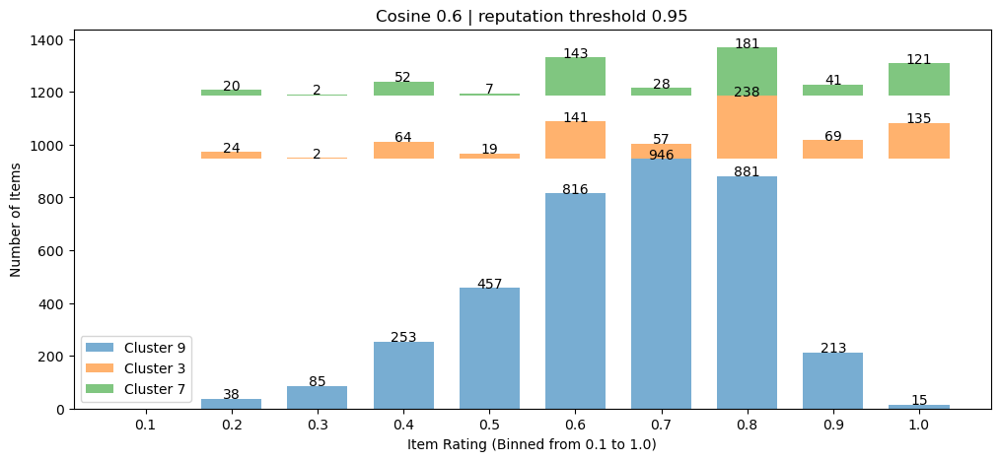

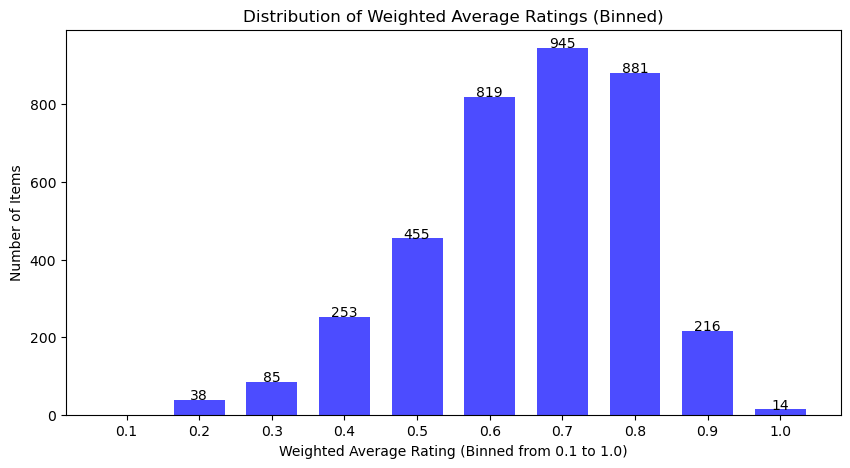

In [16]:
# Assuming user_groups is already defined
cluster_item_ratings, clusterRatingsItems = compute_cluster_ratings(df, user_groups)  # Step 1: Compute initial ratings

print("cluster_item_ratings: ", cluster_item_ratings)

print("clusterRatingsItems: ", clusterRatingsItems)

refined_cluster_ratings, filtered_ratings_byItem = refine_cluster_ratings(df, user_groups, cluster_item_ratings)  # Step 2: Refine ratings

print("refined_cluster_ratings: ", refined_cluster_ratings)
print("filtered_ratings_byItem: ", filtered_ratings_byItem)

weighted_average_dict = compute_weighted_average_cluster_ratings(refined_cluster_ratings, user_groups)

# round all clusters values 
rounded_ratings = round_ratings_to_one_decimal(refined_cluster_ratings)

print("rounded_ratings: ", rounded_ratings)
print("len(rounded_ratings): ", len(rounded_ratings))

plot_top_3_clusters(rounded_ratings)  # Use actual dictionary
plot_weighted_average_distribution(weighted_average_dict)  # Use actual computed weighted averages




**6. Demographics**

In [17]:
from collections import defaultdict

# Define age ranges with lambda checks
age_ranges = {
    "< 18": lambda age: age < 18,
    "18-24": lambda age: 18 <= age <= 24,
    "25-34": lambda age: 25 <= age <= 34,
    "35-44": lambda age: 35 <= age <= 44,
    "45-54": lambda age: 45 <= age <= 54,
    ">= 55": lambda age: age >= 55,
}

# Initialize dictionaries with sets as default values
gender_groups = defaultdict(set)
age_groups = defaultdict(set)

file_path = "/home/martimsbaltazar/Desktop/tese/datasets/ml-1m/users.dat"

with open(file_path, 'r') as file:
    for line in file:
        # Strip newline and split using the '::' delimiter
        parts = line.strip().split("::")
        if len(parts) != 5:
            continue  # Skip malformed lines

        user_id, gender, age_str, _, _ = parts

        user_id = int(user_id)
        age = int(age_str)

        # Match age to a range label
        for label, condition in age_ranges.items():
            if condition(age):
                age_groups[label].add(user_id)
                break  # Stop once matched

        # Gender grouping
        gender_groups[gender].add(user_id)

# Example: Print sizes of each group
print(f"Gender Groups: {gender_groups}") 

print(f"\nAge Groups: {age_groups}")


Gender Groups: defaultdict(<class 'set'>, {'F': {1, 6, 10, 11, 16, 18, 24, 28, 30, 32, 34, 37, 38, 41, 45, 50, 51, 55, 59, 62, 67, 69, 72, 75, 78, 79, 81, 83, 86, 88, 89, 92, 96, 97, 98, 99, 101, 106, 114, 119, 122, 127, 133, 137, 139, 140, 146, 151, 156, 159, 162, 164, 167, 168, 171, 175, 176, 183, 184, 187, 193, 194, 196, 200, 201, 203, 210, 213, 219, 221, 224, 233, 238, 242, 246, 249, 253, 262, 263, 265, 268, 277, 281, 285, 288, 289, 290, 294, 298, 305, 310, 312, 313, 314, 315, 318, 319, 325, 334, 340, 341, 343, 346, 347, 353, 358, 361, 364, 365, 372, 373, 374, 378, 379, 382, 383, 387, 388, 399, 400, 410, 411, 415, 417, 418, 421, 428, 430, 434, 446, 447, 455, 459, 464, 467, 468, 470, 473, 475, 480, 484, 487, 494, 497, 499, 500, 507, 511, 516, 517, 518, 519, 520, 527, 528, 531, 541, 546, 548, 556, 559, 561, 568, 569, 573, 576, 583, 584, 588, 590, 593, 594, 596, 601, 602, 603, 605, 606, 617, 619, 625, 628, 629, 630, 634, 641, 642, 648, 655, 656, 657, 658, 659, 663, 666, 668, 687, 689,

**13.   Metrics**

**13.1  Effectiveness**

In [20]:
def compute_kendall_tau(ranking_1, ranking_2):
    common_items = set(ranking_1.keys()) & set(ranking_2.keys())  # Compare only common items
    
    if len(common_items) < 2:
        return 0  # Need at least two items to compute Kendall's tau
    
    sorted_items = sorted(common_items)  # Ensure consistent order
    
    list_1 = [ranking_1[item] for item in sorted_items]
    list_2 = [ranking_2[item] for item in sorted_items]
    
    return kendalltau(list_1, list_2).correlation

def compute_weighted_kendall_tau(cluster_item_ratings, user_groups):
    
    weighted_tau_sum = 0
    total_weight = sum(len(users) for users in user_groups)  # Total number of users as weight

    for cluster_id, item_ratings in cluster_item_ratings.items():
        tau_cluster = compute_kendall_tau(item_ratings, refined_cluster_ratings[cluster_id])
        cluster_size = len(user_groups[cluster_id - 1])  # Cluster size as weight
        
        weighted_tau_sum += cluster_size * tau_cluster
    
    return weighted_tau_sum / total_weight if total_weight > 0 else 0

print("cluster_item_ratings: ", cluster_item_ratings)
print("refined_cluster_ratings: ", refined_cluster_ratings)
weighted_tau = compute_weighted_kendall_tau(cluster_item_ratings, user_groups)
print(f"Weighted Kendall’s τ: {weighted_tau:.4f}")


cluster_item_ratings:  {1: {1: 0.8, 6: 1.0, 10: 0.6, 11: 1.0, 32: 1.0, 34: 0.9333333333333332, 36: 0.6, 39: 0.7333333333333334, 50: 1.0, 58: 0.8, 66: 0.4, 73: 0.8, 77: 0.8, 110: 0.8250000000000001, 111: 1.0, 112: 0.6, 117: 0.6, 125: 0.8, 159: 0.8, 162: 0.8, 165: 1.0, 170: 0.6, 224: 0.8, 236: 0.8, 239: 0.8, 242: 0.6, 246: 0.9, 260: 0.9428571428571428, 265: 0.8, 266: 0.8, 290: 0.8, 293: 0.8, 296: 0.6, 318: 0.9333333333333332, 320: 0.6, 324: 0.6, 327: 0.8, 329: 0.8, 344: 0.4, 345: 0.5, 350: 0.6, 356: 1.0, 357: 0.6, 363: 0.8, 370: 0.6, 376: 1.0, 380: 1.0, 383: 0.8, 420: 0.4, 457: 0.9, 459: 0.6, 466: 1.0, 480: 0.8, 506: 0.6, 508: 1.0, 527: 0.9333333333333332, 541: 1.0, 549: 0.9, 553: 1.0, 556: 0.8, 558: 0.8, 574: 0.8, 588: 0.7333333333333334, 589: 1.0, 593: 0.8500000000000001, 594: 1.0, 595: 0.6, 596: 0.6, 597: 1.0, 599: 1.0, 608: 0.7, 616: 0.8, 648: 1.0, 681: 0.8, 728: 0.8, 741: 0.6, 778: 1.0, 783: 0.8, 800: 1.0, 832: 0.8, 858: 0.9666666666666667, 879: 0.8, 902: 0.4, 908: 1.0, 912: 0.79999

**13.2 Bias**

In [22]:
def compute_bias(restriction, demographic_group):
    """
    Computes the bias B(i) for each item in each cluster with respect to a specific demographic group.

    Bias B(i) is defined as the difference between the retention rate of users **not** in the demographic group 
    (P_complement(i)) and the retention rate of users **in** the group (P(i)), for a given item i.

    Retention rate P(i) is calculated as:
        P(i) = (# of ratings retained by target group users for item i) / (# of ratings given by target group users for item i)

    Parameters:
    ----------
    restriction : str
        The demographic group key

    demographic_group : dict
        A dictionary mapping demographic group names to sets of user IDs, e.g.:

    Returns:
    -------
    dict
        A nested dictionary with all clusters and items, where each item has a bias value B(i) associated with it.

    Notes:
    -----
    - A positive B(i) indicates that users **not** in the demographic group have higher retention rates.
    - A negative B(i) indicates the demographic group has higher retention.
    - A value of 0 means no retention bias is present for the item.
    - If no users from the target group rated an item, P(i) is set to 0 by default.
    - If no users from the complement group rated the item, P_complement(i) is also set to 0.
    """
    retention_rates = {}

    # Get the users in the demographic group
    target_users = demographic_group[restriction]

    for clusterID, itemRatingsbyUser in clusterRatingsItems.items():
        for item, users in itemRatingsbyUser.items():
            # Users from the target group who rated the item
            U_i = len(users & target_users)

            # Users from the target group whose ratings got filtered
            filtered_users = (
                filtered_ratings_byItem[clusterID][item]
                if clusterID in filtered_ratings_byItem and item in filtered_ratings_byItem[clusterID]
                else set()
            )

            R_i = U_i - len(filtered_users & target_users)  # Retained ratings

            # Compute P(i)
            P_i = R_i / U_i if U_i > 0 else 0

            # Compute the complement group (all other users that rated the item but are not in the target group)
            non_target_users = users - target_users

            U_complement_i = len(non_target_users)
            R_complement_i = U_complement_i - len(filtered_users & non_target_users)

            # Compute P_complement(i)
            P_complement_i = R_complement_i / U_complement_i if U_complement_i > 0 else 0

            # Compute B(i) = |P_complement(i) - P(i)|
            B_i = abs(P_i - P_complement_i)

            # Store results in the nested dictionary
            if clusterID not in retention_rates:
                retention_rates[clusterID] = {}
            retention_rates[clusterID][item] = B_i

    return retention_rates

def compute_weighted_average_bias(bias_by_cluster, clusterRatingsItems):
    """
    Computes the weighted average bias across all clusters.
    The weight for each cluster is the number of items it contains.

    Parameters:
    - bias_by_cluster: {clusterID: {itemID: B(i)}}
    - clusterRatingsItems: {clusterID: {itemID: set(userIDs)}}

    Returns:
    - weighted_avg_bias: float
    """
    total_weighted_bias = 0
    total_weight = 0

    for cluster_id, item_biases in bias_by_cluster.items():
        total_cluster_bias = np.mean(list(item_biases.values()))
        num_items = len(item_biases)

        total_weighted_bias += total_cluster_bias * num_items
        total_weight += num_items

    weighted_avg_bias = total_weighted_bias / total_weight if total_weight > 0 else 0
    return weighted_avg_bias


print("--------------------- AGE_GROUPS ---------------------")

bias_results = compute_bias("< 18", age_groups)
weighted_average = compute_weighted_average_bias(bias_results, clusterRatingsItems)
print("< 18",weighted_average)
bias_results = compute_bias("18-24", age_groups)
weighted_average = compute_weighted_average_bias(bias_results, clusterRatingsItems)
print("18-24",weighted_average)
bias_results = compute_bias("25-34", age_groups)
weighted_average = compute_weighted_average_bias(bias_results, clusterRatingsItems)
print("25-34", weighted_average)
bias_results = compute_bias("35-44", age_groups)
weighted_average = compute_weighted_average_bias(bias_results, clusterRatingsItems)
print("34-44", weighted_average)
bias_results = compute_bias("45-54", age_groups)
weighted_average = compute_weighted_average_bias(bias_results, clusterRatingsItems)
print("45-54", weighted_average)
bias_results = compute_bias(">= 55", age_groups)
weighted_average = compute_weighted_average_bias(bias_results, clusterRatingsItems)
print(">= 55", weighted_average)

print("\n--------------------- CONTINENT ---------------------")
bias_results = compute_bias("F", gender_groups)
weighted_average = compute_weighted_average_bias(bias_results, clusterRatingsItems)
print("F", weighted_average)
bias_results = compute_bias("M", gender_groups)
weighted_average = compute_weighted_average_bias(bias_results, clusterRatingsItems)
print("M", weighted_average)



--------------------- AGE_GROUPS ---------------------
< 18 0.6655673545423545
18-24 0.5267295478551842
25-34 0.4788965791049963
34-44 0.4950205715432888
45-54 0.5092377341095966
>= 55 0.6101931181805085

--------------------- CONTINENT ---------------------
F 0.48322431525778897
M 0.48322431525778897
